#Authors
**Author 1 (name and surname):** Alan García Justel

**Author 2 (name and surname):** < Put your name and surname here >

# Preamble: download and unzip image folder

In [ ]:
!wget -O images.zip https://ehubox.ehu.eus/s/sMHxHAA7SEnQWSH/download
!unzip images.zip

--2025-02-16 17:47:45--  https://ehubox.ehu.eus/s/sMHxHAA7SEnQWSH/download
Resolving ehubox.ehu.eus (ehubox.ehu.eus)... 158.227.0.95
Connecting to ehubox.ehu.eus (ehubox.ehu.eus)|158.227.0.95|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 853599 (834K) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>] 833.59K   791KB/s    in 1.1s    

2025-02-16 17:47:47 (791 KB/s) - ‘images.zip’ saved [853599/853599]

Archive:  images.zip
   creating: images/
  inflating: images/cameraman.jpg    
  inflating: images/coins.png        
  inflating: images/moon.tif         
  inflating: images/pout.tif         
  inflating: images/eight.tif        
  inflating: images/moo2.png         
  inflating: images/mandrill.png     
  inflating: images/crowd.png        
  inflating: images/tire.tif         


#Exercise 1:
Using the knowledge acquired in lab 2, find a way of properly adjusting the histograms of `crowd.png` and `moo2.png` to better visualize the details and content of the images. Try using both regular histogram equalization and adaptive equalization with different parameters.

In [ ]:
!pip install opencv-python

In [ ]:
# Imports of the notebook
import numpy as np
import cv2

from scipy.signal import convolve, convolve2d

from typing import Tuple, Literal, List
from enum import Enum

from IPython.display import display, HTML
import matplotlib.animation as animation
import matplotlib.pyplot as plt

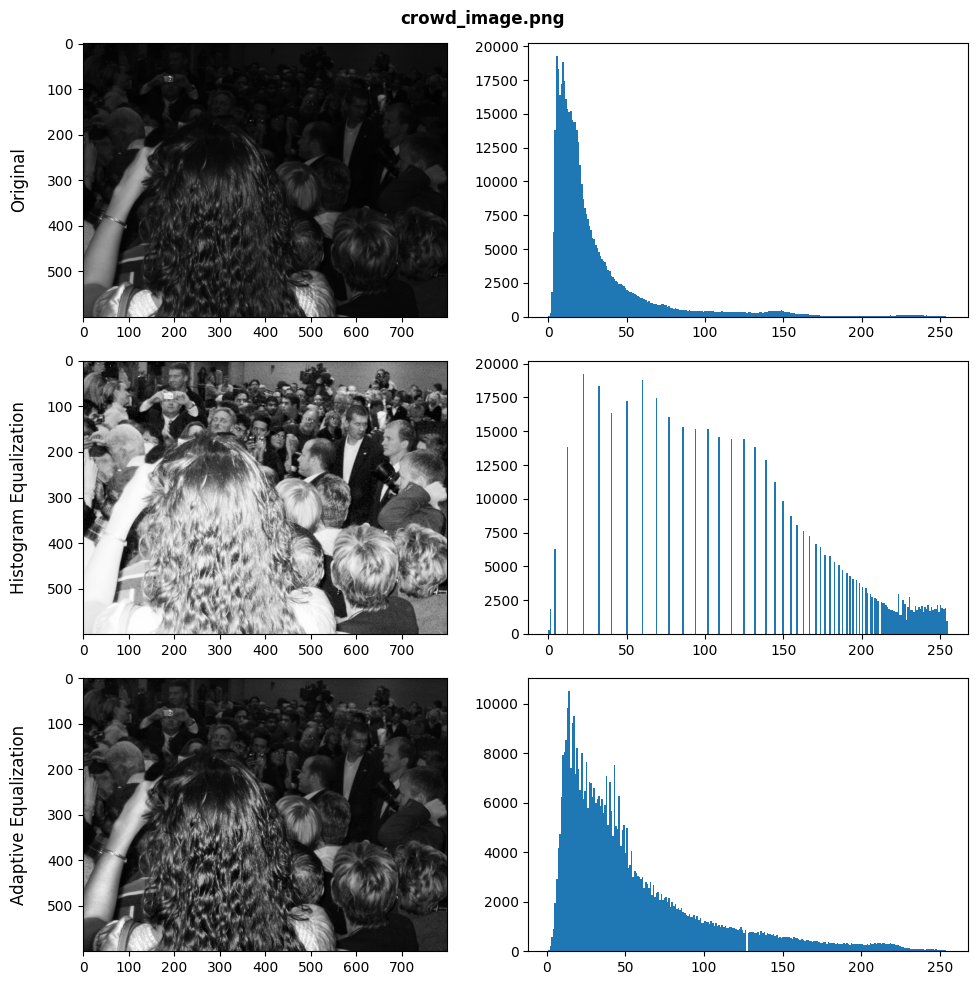

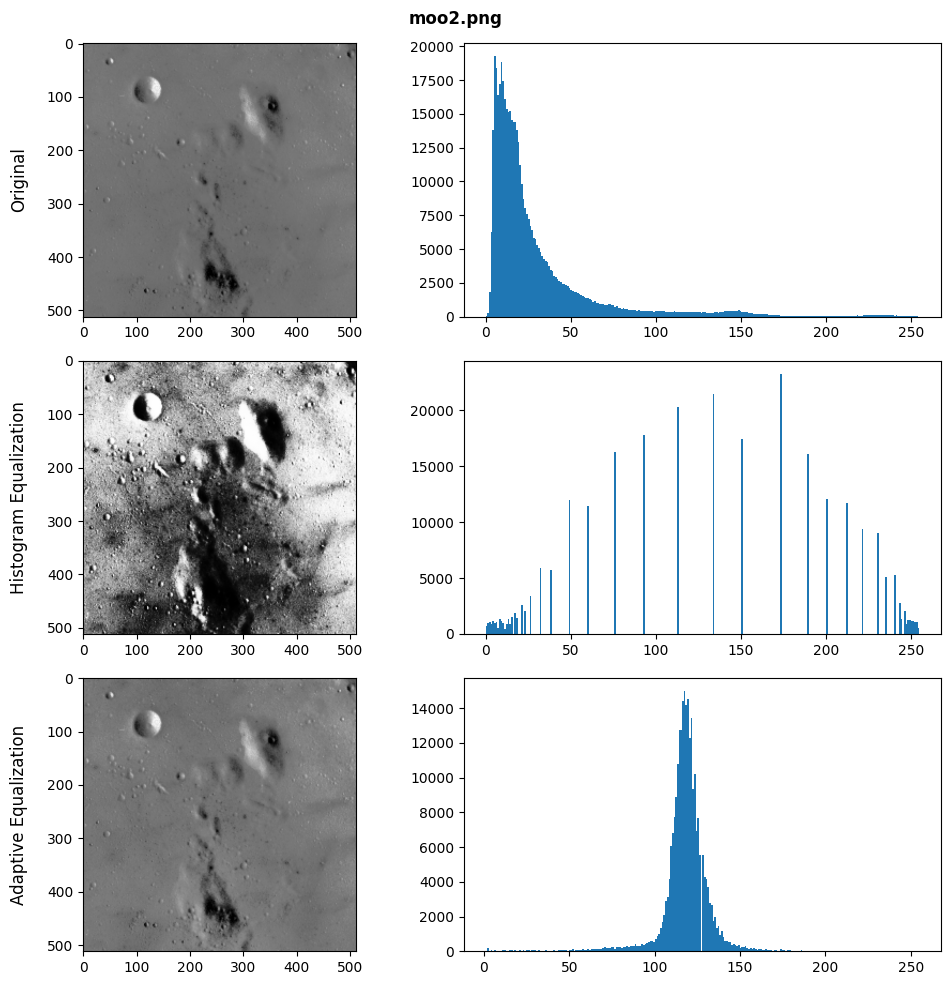

In [ ]:
def adjust_hist_of_image(image:np.ndarray, title:str="", clipLimit:float=2.0, tileGridSize:Tuple[int, int]=(8, 8)) -> None:
  """
  INPUT:
    - image: (H, W) GrayScale image
  """
  if len(image.shape) != 2:
    raise Exception("Image must be a grayscale 8-bit image")

  f, axes = plt.subplots(3, 2, figsize=(10, 10))

  # Imagen e histograma originales
  axes[0, 0].imshow(image, cmap='gray')
  axes[0, 1].hist(crowd_image.ravel(), bins=256)

  # Equalización de histograma
  eq = cv2.equalizeHist(image)
  axes[1, 0].imshow(eq, cmap='gray')
  axes[1, 1].hist(eq.ravel(), bins=256)

  # Equalización Adaptativa con CLAHE
  clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
  adapt_eq = clahe.apply(image)
  axes[2, 0].imshow(adapt_eq, cmap='gray')
  axes[2, 1].hist(adapt_eq.ravel(), bins=256)

  # Agregar etiquetas
  labels = ["Original", "Histogram Equalization", "Adaptive Equalization"]
  for i in range(3):
    # for j in range(2):
    #   axes[i, j].axis("off" if j == 0 else "on")
    axes[i, 0].set_ylabel(labels[i], rotation=90, labelpad=20, fontsize=12, verticalalignment='center')

  plt.suptitle(title, fontweight='bold')
  plt.tight_layout()
  plt.show()


crowd_path = "./images/crowd.png"
crowd_image = cv2.imread(crowd_path, cv2.IMREAD_GRAYSCALE)
adjust_hist_of_image(crowd_image, title="crowd_image.png")

moo2_path = "./images/moo2.png"
moo2_image = cv2.imread(moo2_path, cv2.IMREAD_GRAYSCALE)
adjust_hist_of_image(moo2_image, title="moo2.png", clipLimit=1.0, tileGridSize=(3, 3))


#Exercise 2
We'll perform a similar analysis to the 2D convolution example in lab 2, but now we will try using and not using the zero crossing of the gradient:

$DI=\sqrt{(DxI)^2+(DyI)^2}$

where $DxI$ and $DyI$ are computed through convolution of the image with the kernels

$\begin{equation}
  kx=0.5
    \begin{pmatrix}
        0 & 0 & 0\\
        -1 & 0 & 1\\
        0 & 0 & 0
    \end{pmatrix}
\end{equation}$
$\begin{equation}
  ,\; ky=0.5
    \begin{pmatrix}
        0 & -1 & 0\\
        0 & 0 & 0\\
        0 & 1 & 0
    \end{pmatrix}
\end{equation}$

Repeat Steps 1-4 from the example in the lab introducing the following changes:
* Load the image `coins.png` and set `noise=0.5`.
* Play with the number of iterations in Step 2, and visualize some of them to understand how the smoothing effect works. You can use `cv2.GaussianBlur` function as well.
* In Step 3, implement the zero-crossing filter for $DI$. In this case, set `threshold=0.01`.
* Use the smoothed image thresholding of Step 4.

<figure>
<center>
<img src="https://drive.google.com/uc?id=1AYtKTiMA0XVjTS_nr0ezUW-URnd7Sct1"
width="650">
</figure>

In [ ]:
class Params:
  image:np.ndarray = None
  image_noise:float=0.5
  blur_num_iterations:int=100
  blur_ksize:int = 3
  blur_type:Literal["gaussian", "average"] = 'gaussian'
  z_threshold:float = 0.01
  smoothing_value:float = 0.5
  I1:np.ndarray  = None
  I2:np.ndarray  = None
  DI:np.ndarray  = None
  Z:np.ndarray   = None
  Z4:np.ndarray  = None
  def __init__(self, **kwargs):
    for k, v in kwargs.items():
      setattr(self, k, v)

class FrameType(Enum):
  I1  = 0
  I2  = 1
  DI  = 2
  Z   = 3
  Z4  = 4

def get_DI(I:np.ndarray):
    kx = 0.5 * np.array([[0, 0, 0], [-1, 0, 1], [0, 0, 0]])
    ky = 0.5 * np.array([[0, -1, 0], [0, 0, 0], [0, 1, 0]])
    DxI = convolve2d(I, kx, mode='same', boundary='symm')
    DyI = convolve2d(I, ky, mode='same', boundary='symm')
    DI = np.sqrt(np.power(DxI, 2) + np.power(DyI, 2))
    return DI

def conv_image_filtering(image:np.ndarray,
                         image_noise:float=0.5,
                         blur_num_iterations:int=100,
                         blur_ksize:int = 3,
                         blur_type:Literal["gaussian", "average"] = 'gaussian',
                         z_threshold:float = 0.01,
                         smoothing_value:float = 0.5,
                         I1:np.ndarray  = None,
                         I2:np.ndarray  = None,
                         DI:np.ndarray  = None,
                         Z:np.ndarray   = None,
                         Z4:np.ndarray  = None
                         ) -> Tuple[np.ndarray, np.ndarray]:
  """
  Parameters
  ----------
  - image:str
      (H, W) GrayScale image
  - image_noise
      [I1] noise intensity to be applied to the original image [0, 1]
  - blur_num_iterations
      [I2] number of passes of blur
  - blur_ksize
      [I2] kernel size of the blur to be applied
  - blur_type
      [I2] type of blur -> ['average', 'gaussian']
  - z_threshold:float
      [Z] threshold for border filtering
  - I1
      Image with random noise. If set the step 1 will be skipped.
  - I2
      Image with noise and blur. If set the step 2 will be skipped.
  - DI
      I2 image convolved with kx and ky kernels. If set the step 3 will be skipped.
  - Z
      DI image with zero-crossing filter applied. If set the step 4 will be skipped.
  - Z4
      Borders detected by smoothing I2 with smooth_value, covolving with kx and ky and applying zero-crossing filter.
      If set the step 5 will be skipped

  Returns
  ----------
  Tuple of
    - Original image with noise
    - Noise image with gaussian blur

  """

  # 1. Add noise to image
  if I1 is None and I2 is None and DI is None:
    if len(image.shape) != 2:
      raise Exception("Image must be a grayscale 8-bit image")

    image_double = cv2.normalize(image.copy().astype('float'), None, 0.0, 1.0, cv2.NORM_MINMAX)
    random_mat = np.random.randn(image_double.shape[0], image_double.shape[1])
    I1 = image_double + np.dot(image_noise,random_mat)

  # 2. Apply blur to the noised image
  if I2 is None:
    if blur_type == 'gaussian':

      # Gaussian noise for k iterations
      I2 = I1.copy()
      for _ in range(blur_num_iterations):
        I2 = cv2.GaussianBlur(I2, ksize=(blur_ksize, blur_ksize), sigmaX=0.5, sigmaY=0.5)

    elif blur_type == 'average':

      # Average Noise for k iterations
      I2 = I1.copy()
      averaging_kernel = np.ones((blur_ksize, blur_ksize)) / (blur_ksize*blur_ksize)
      for k in range(blur_num_iterations):
        I2 = convolve(I2, averaging_kernel, mode='same')
        # I2 = cv2.blur(I2, ksize=(blur_ksize, blur_ksize))

    else:
      raise Exception("Unknown noise type")

  # 3. Compute convolution filter of I2
  if DI is None:
    DI = get_DI(I2.copy())

  # 4. Find edges with zero-crossing filter over DI
  if Z is None:
    Z = np.ones( DI.shape )
    ind = np.nonzero( np.abs( DI ) < z_threshold )
    Z[ ind ] = 0

  # 5. Use smoothing and repeat steps 3 and 4
  if Z4 is None:
    I2_aux = I2 * ( I2 > smoothing_value )
    DI_aux = get_DI(I2_aux.copy())
    ind = np.nonzero( np.abs( DI_aux ) < z_threshold )
    Z4 = np.ones( DI_aux.shape )
    Z4[ ind ] = 0

  return I1, I2, DI, Z, Z4

def create_gif_with_params(params:List[Params], frame_type:FrameType, title:str="") -> HTML:
  """
  Takes a list of parameters and creates a gif with all the generated frames of frame_type
  """
  # Generate frames using params
  frames = []
  for p in params:
      if frame_type == FrameType.I1 and p.image is None:
        raise Exception("It is neccesary to set the image for creating a gif showing variations on I1")
      if frame_type == FrameType.I2 and p.I1 is None:
        raise Exception("It is neccesary to set I1 for creating a gif showing variations on I2")
      if frame_type == FrameType.Z and p.I2 is None and p.DI is None:
        raise Exception("It is neccesary to set I2 or DI for creating a gif showing variations on Z")
      if frame_type == FrameType.Z4 and p.I2 is None:
        raise Exception("It is neccesary to set I2 for creating a gif showing variations on Z4")

      f = conv_image_filtering(
          image = p.image,
          image_noise=p.image_noise,
          blur_num_iterations=p.blur_num_iterations,
          blur_ksize=p.blur_ksize,
          blur_type=p.blur_type,
          z_threshold=p.z_threshold,
          smoothing_value=p.smoothing_value,
          I1=p.I1,
          I2=p.I2,
          DI=p.DI,
          Z=p.Z,
          Z4=p.Z4
          )
      frames.append(f[frame_type.value])
  # Create matplotlib animation
  fig, ax = plt.subplots()
  fig.suptitle(title)
  img_display = ax.imshow(frames[0], cmap="gray", animated=True)

  def update_frame(fk):
      img_display.set_array(frames[fk])
      return [img_display]
  noise_ani = animation.FuncAnimation(fig, update_frame, frames=len(frames), interval=100, blit=True)
  plt.close(fig)
  return HTML(noise_ani.to_jshtml())

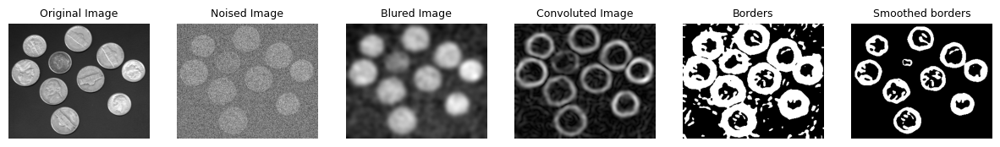

In [ ]:
image = cv2.imread("images/coins.png", cv2.IMREAD_GRAYSCALE)
I1, I2, DI, Z, Z4 = conv_image_filtering(image)

images = [image, I1, I2, DI, Z, Z4]
labels = ["Original Image", "Noised Image", "Blured Image", "Convoluted Image", "Borders", "Smoothed borders" ]

f, axes = plt.subplots(1, 6, figsize=(15, 15))
for i, ax in enumerate(axes):
  ax.imshow(images[i], cmap='gray')
  ax.set_title(labels[i], fontsize=9)
  ax.axis('off')
plt.show()


In [ ]:
# Noise variations in original image: I1
image = cv2.imread("images/coins.png", cv2.IMREAD_GRAYSCALE)
noise_values = np.linspace(0, 1.0, 10)
noise_params = [Params(image=image, image_noise=n) for n in noise_values]
noise_gif = create_gif_with_params(noise_params, frame_type=FrameType.I1, title="Noise variation in original image")

# Change the number of iterations to see how the blur increases
blur_iterations = range(1, 100, 10)

blur_average_params   = [Params(I1=I1, blur_type='average', blur_num_iterations=bi) for bi in blur_iterations]
blur_avg_gif = create_gif_with_params(blur_average_params, frame_type=FrameType.I2, title="Average Blur variations from noised image")

blur_gaussian_params  = [Params(I1=I1, blur_type='gaussian', blur_num_iterations=bi) for bi in blur_iterations]
blur_gauss_gif = create_gif_with_params(blur_gaussian_params, frame_type=FrameType.I2, title="Gaussian Blur variations from noised image")

# play with the z_threshold for border detection (without smoothing)
z_values = np.linspace(0.001, 0.05, 20)
z_params = [Params(I1=I1, I2=I2, DI=DI, z_threshold=z) for z in z_values]
z_gif         = create_gif_with_params(z_params, frame_type=FrameType.Z,  title="Z_threshold variations without smoothing")
z_gif_smooth  = create_gif_with_params(z_params, frame_type=FrameType.Z4, title="Z_threshold variations with smoothing")

In [ ]:
# Flexbox container
display(HTML("""
<div style="display: flex; gap: 10px;">
    <div>{}</div>
    <div>{}</div>
    <div>{}</div>
    <div>{}</div>
    <div>{}</div>
</div>
""".format(noise_gif.data, blur_avg_gif.data, blur_gauss_gif.data, z_gif.data, z_gif_smooth.data)))


#Exercise 3
Load the image `mandrill.png` and do the following:

**Exercise 3.1:** Implement and apply larger and larger averaging filters to this image. **Q3.1:** What is the smallest sized filter for which the whiskers cannot be seen?


In [ ]:
mandrill_image = cv2.imread("images/mandrill.png", cv2.IMREAD_GRAYSCALE)
print(f"mandrill_image.shape: {mandrill_image.shape}")

# Fix the number of averaging filter to a constant value
averaging_iterations = 1

# Change the kernel size from 1x1 up to the first 20 odd numbers
max_kernel_size = np.min(mandrill_image.shape[:-1])
kernel_sizes = range(1, max_kernel_size)
kernel_sizes = [ks for ks in kernel_sizes if ks % 2 != 0][:25]
print(f"Using kernel sizes from: {kernel_sizes}")

# Create params varing the kernel size for the image (without adding noise to the image)
I1,_,_,_,_ = conv_image_filtering(mandrill_image, image_noise=0.0)
kernel_params = [Params(I1=I1, blur_num_iterations=averaging_iterations, blur_ksize=ks, blur_type='average') for ks in kernel_sizes]

# Create a gif to show the variation on the averagin filter
create_gif_with_params(kernel_params, frame_type=FrameType.I2, title="Kernel size variations on averaging filter")


mandrill_image.shape: (480, 500)
Using kernel sizes from: [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49]


In [ ]:
kernel_sizes[17]

35

## Answers
**Q3.1: What is the smallest sized filter for which the whiskers cannot be seen?**

It seems to be a kernel size of 35x35. We are considering the original image without aggregated noise and we are using just one iteration to produce the averaged image.

**Exercise 3.2:** Read through the help page of the [`skimage.filters`](https://scikit-image.org/docs/dev/api/skimage.filters.html) library, and apply some of the other filters (Sobel, Prewitt…) to the cameraman image, and to the mandrill image. In addition to the previous filters, apply a Laplacian filter of different sizes to the mandrill and cameraman images. **Q3.2: Which one produces the best edge image?**


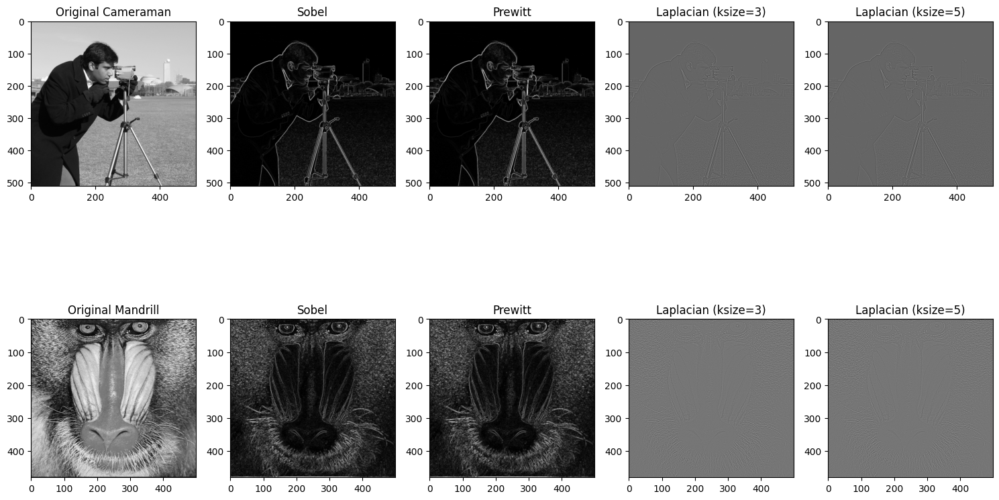

In [ ]:
import matplotlib.pyplot as plt
from skimage import data, filters, color
from skimage.io import imread
from skimage.filters import sobel, prewitt, laplace
from skimage.color import rgb2gray

# Load images
cameraman = data.camera()
mandrill_gray = cv2.imread("images/mandrill.png", cv2.IMREAD_GRAYSCALE)

# Apply filters
sobel_cameraman = sobel(cameraman)
prewitt_cameraman = prewitt(cameraman)
laplace_cameraman = laplace(cameraman, ksize=3)
laplace_cameraman_5 = laplace(cameraman, ksize=5)

sobel_mandrill = sobel(mandrill_gray)
prewitt_mandrill = prewitt(mandrill_gray)
laplace_mandrill_3 = laplace(mandrill_gray, ksize=3)
laplace_mandrill_5 = laplace(mandrill_gray, ksize=5)

# Display results
fig, ax = plt.subplots(2, 5, figsize=(15, 10))

# Cameraman images
ax[0, 0].imshow(cameraman, cmap='gray')
ax[0, 0].set_title('Original Cameraman')
ax[0, 1].imshow(sobel_cameraman, cmap='gray')
ax[0, 1].set_title('Sobel')
ax[0, 2].imshow(prewitt_cameraman, cmap='gray')
ax[0, 2].set_title('Prewitt')
ax[0, 3].imshow(laplace_cameraman, cmap='gray')
ax[0, 3].set_title('Laplacian (ksize=3)')
ax[0, 4].imshow(laplace_cameraman_5, cmap='gray')
ax[0, 4].set_title('Laplacian (ksize=5)')

# Mandrill images
ax[1, 0].imshow(mandrill_gray, cmap='gray')
ax[1, 0].set_title('Original Mandrill')
ax[1, 1].imshow(sobel_mandrill, cmap='gray')
ax[1, 1].set_title('Sobel')
ax[1, 2].imshow(prewitt_mandrill, cmap='gray')
ax[1, 2].set_title('Prewitt')
ax[1, 3].imshow(laplace_mandrill_3, cmap='gray')
ax[1, 3].set_title('Laplacian (ksize=3)')
ax[1, 4].imshow(laplace_mandrill_5, cmap='gray')
ax[1, 4].set_title('Laplacian (ksize=5)')

plt.tight_layout()
plt.show()


**Q3.2: Which one produces the best edge image?**

The Sobel filter generally produces smooth and strong edges, making it often the most visually appealing and accurate for edge detection. However, for finer edges, the Laplacian filter with a larger kernel size may detect more intricate details, though it can also introduce more noise. In this case, the Sobel filter provides the best balance of smoothness and detail, making it the best choice for the edge images of both the cameraman and mandrill.

# Egela submission
Copy this notebook to your Drive and solve the proposed exercises there.

Rename the notebook as `assignment-2-name1-surname1-name2-surname2.ipynb` (replace *name1-surname1* and *name2-surname2* with team member names and surnames).

Use the "share" button and make sure you configure such that "Anyone on the Internet with this link can view".

Copy the link provided by the "share" menu and paste it here. Only one member of the team should submit the notebook

<font color=red>**Important**</font>: Make sure the notebook is <u>fully run</u> and the "traces" are visible (run times) when you submit.

**Submission deadline:** Sunday, February 16th 2025, 0:00h.